In [53]:
import pandas as pd
import numpy as np
import os.path
import numpy as np
import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
import statsmodels.formula.api as smf



In [54]:
import warnings
warnings.filterwarnings('ignore')

In [55]:
nba_2021 = pd.read_csv('nba_2021.csv', index_col=0)

In [3]:
nba_2021.head()

,Name,Team,Age,Games,Games_Start,Min_PG,Field_Goals,Field_Goals_Attempts,3Point_Goals,3Point_Goals_Attempts,...,Free_Throw,Free_Throw_Attempts,Offensive_Rebounds,Defensive_Rebounds,Assists,Steals,Blocks,Turnovers,Points,Position
0,Trae Young,ATL,22,63,63,33.7,7.7,17.7,2.2,6.3,...,7.7,7.7,0.6,3.3,9.4,0.8,0.2,4.1,25.3,Point Guard
1,Kevin Huerter,ATL,22,69,49,30.8,4.6,10.6,2.0,5.6,...,0.7,0.7,0.6,2.8,3.5,1.2,0.3,1.1,11.9,Shooting Guard
2,Clint Capela,ATL,26,63,63,30.1,6.6,11.0,0.0,0.0,...,2.1,2.1,4.7,9.6,0.8,0.7,2.0,1.2,15.2,Center
3,Bogdan Bogdanović,ATL,28,44,27,29.7,6.1,12.8,3.3,7.6,...,0.9,0.9,0.5,3.2,3.3,1.1,0.3,1.2,16.4,Shooting Guard
4,De'Andre Hunter,ATL,23,23,19,29.5,5.2,10.8,1.3,4.1,...,3.2,3.2,0.7,4.0,1.9,0.8,0.5,1.3,15.0,Small Forward


In [4]:
nba_2021.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 626 entries, 0 to 625
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Name                      626 non-null    object 
 1   Team                      626 non-null    object 
 2   Age                       626 non-null    int64  
 3   Games                     626 non-null    int64  
 4   Games_Start               626 non-null    int64  
 5   Min_PG                    626 non-null    float64
 6   Field_Goals               626 non-null    float64
 7   Field_Goals_Attempts      626 non-null    float64
 8   3Point_Goals              626 non-null    float64
 9   3Point_Goals_Attempts     626 non-null    float64
 10  2Point_Goals              626 non-null    float64
 11  2Point_Goals_Attempts     626 non-null    float64
 12  Effective_Field_Goal_Per  624 non-null    float64
 13  Free_Throw                626 non-null    float64
 14  Free_Throw

In [5]:
len(nba_2021.index)

626

In [6]:
nba_2020 = pd.read_csv('nba_2020.csv', index_col=0)
nba_2019 = pd.read_csv('nba_2019.csv', index_col=0)

In [7]:
print(nba_2020.info())
print(nba_2019.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 591 entries, 0 to 590
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Name                      591 non-null    object 
 1   Team                      591 non-null    object 
 2   Age                       591 non-null    int64  
 3   Games                     591 non-null    int64  
 4   Games_Start               591 non-null    int64  
 5   Min_PG                    591 non-null    float64
 6   Field_Goals               591 non-null    float64
 7   Field_Goals_Attempts      591 non-null    float64
 8   3Point_Goals              591 non-null    float64
 9   3Point_Goals_Attempts     591 non-null    float64
 10  2Point_Goals              591 non-null    float64
 11  2Point_Goals_Attempts     591 non-null    float64
 12  Effective_Field_Goal_Per  589 non-null    float64
 13  Free_Throw                591 non-null    float64
 14  Free_Throw

In [8]:
nba_2021['Year'] = pd.Series([2021 for x in range(len(nba_2021.index))])
nba_2020['Year'] = pd.Series([2020 for x in range(len(nba_2020.index))])
nba_2019['Year'] = pd.Series([2019 for x in range(len(nba_2019.index))]) 

In [9]:
salary_2021 = pd.read_csv('salaries_2021.csv', index_col=0)
salary_2020 = pd.read_csv('salaries_2020.csv', index_col=0)
salary_2019 = pd.read_csv('salaries_2019.csv', index_col=0)

In [10]:
salary_2021.head()

,Year,Name,Salary,Team
0,2021,Garrison Mathews,0,ATL
1,2021,Danilo Gallinari,"19,500,000",ATL
2,2021,Bogdan Bogdanović,"18,000,000",ATL
3,2021,Clint Capela,"16,000,000",ATL
4,2021,Tony Snell,"12,178,571",ATL


In [11]:
print(salary_2021.info())
print('--------------')
print(salary_2020.info())
print('---------------')
print(salary_2019.info())


<class 'pandas.core.frame.DataFrame'>
Int64Index: 654 entries, 0 to 653
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Year    654 non-null    int64 
 1   Name    654 non-null    object
 2   Salary  654 non-null    object
 3   Team    654 non-null    object
dtypes: int64(1), object(3)
memory usage: 25.5+ KB
None
--------------
<class 'pandas.core.frame.DataFrame'>
Int64Index: 645 entries, 0 to 644
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Year    645 non-null    int64 
 1   Name    645 non-null    object
 2   Salary  645 non-null    object
 3   Team    645 non-null    object
dtypes: int64(1), object(3)
memory usage: 25.2+ KB
None
---------------
<class 'pandas.core.frame.DataFrame'>
Int64Index: 655 entries, 0 to 654
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Year    655 non-null    int64 
 1   

# Data Cleaning

## Duplicate Check

There should be one observation for 

In [12]:
#duplicate player check for each season
#any players in nba_2021 data is expected to show up at most 1 times
#if he didn't transfer to another team during the season
dup_2021 = pd.Series(nba_2021['Name']).value_counts().reset_index(name='counts')
dup_2021[dup_2021['counts']>1]


,index,counts
0,Victor Oladipo,3
1,Rodions Kurucs,3
2,Norvel Pelle,3
3,Gary Clark,3
4,Moritz Wagner,3
...,...,...
74,Torrey Craig,2
75,Taurean Prince,2
76,Jabari Parker,2
77,Luke Kornet,2


In [13]:
dup_sal_2021 = pd.Series(salary_2021['Name']).value_counts().reset_index(name='counts')
dup_sal_2021[dup_sal_2021['counts']>1]

,index,counts
0,Mason Jones,4
1,Justin Jackson,3
2,Devin Cannady,3
3,Jared Harper,3
4,Chimezie Metu,3
...,...,...
66,Yuta Watanabe,2
67,Gorgui Dieng,2
68,Frank Jackson,2
69,Blake Griffin,2


In [14]:
nba_2021.loc[(nba_2021['Name'] == 'Victor Oladipo')]

,Name,Team,Age,Games,Games_Start,Min_PG,Field_Goals,Field_Goals_Attempts,3Point_Goals,3Point_Goals_Attempts,...,Free_Throw_Attempts,Offensive_Rebounds,Defensive_Rebounds,Assists,Steals,Blocks,Turnovers,Points,Position,Year
211,Victor Oladipo,HOU,28,20,20,33.5,7.8,19.1,2.5,7.7,...,3.3,0.4,4.4,5.0,1.2,0.5,2.6,21.2,Shooting Guard and Point Guard,2021
242,Victor Oladipo,IND,28,9,9,33.3,7.1,16.9,2.8,7.7,...,3.0,0.1,5.6,4.2,1.7,0.2,2.0,20.0,Shooting Guard and Point Guard,2021
323,Victor Oladipo,MIA,28,4,4,27.8,4.0,10.8,1.0,4.3,...,3.0,0.8,2.8,3.5,1.8,0.5,3.5,12.0,Shooting Guard and Point Guard,2021


In [15]:
salary_2021.loc[salary_2021['Name']=='Victor Oladipo']

,Year,Name,Salary,Team
325,2021,Victor Oladipo,"21,000,000",MIA


In [16]:
nba_2021.loc[(nba_2021['Name'] == 'Rodions Kurucs')]

,Name,Team,Age,Games,Games_Start,Min_PG,Field_Goals,Field_Goals_Attempts,3Point_Goals,3Point_Goals_Attempts,...,Free_Throw_Attempts,Offensive_Rebounds,Defensive_Rebounds,Assists,Steals,Blocks,Turnovers,Points,Position,Year
64,Rodions Kurucs,BRK,22,5,0,3.2,0.2,0.6,0.2,0.4,...,0.0,0.0,0.6,0.4,0.0,0.0,0.0,0.6,Small Forward and Power Forward,2021
237,Rodions Kurucs,HOU,22,11,0,6.8,0.5,1.9,0.2,1.4,...,0.1,0.2,0.8,0.4,0.5,0.4,0.8,1.2,Small Forward and Power Forward,2021
358,Rodions Kurucs,MIL,22,5,0,6.8,1.0,1.6,0.6,0.8,...,0.4,0.6,1.2,0.8,0.6,0.0,0.8,3.0,Small Forward and Power Forward,2021


In [17]:
salary_2021.loc[salary_2021['Name']=='Rodions Kurucs']

,Year,Name,Salary,Team
355,2021,Rodions Kurucs,"1,780,152",MIL


In [18]:
nba_2021.loc[(nba_2021['Name'] == 'Luke Kornet')]

,Name,Team,Age,Games,Games_Start,Min_PG,Field_Goals,Field_Goals_Attempts,3Point_Goals,3Point_Goals_Attempts,...,Free_Throw_Attempts,Offensive_Rebounds,Defensive_Rebounds,Assists,Steals,Blocks,Turnovers,Points,Position,Year
32,Luke Kornet,BOS,25,18,2,14.1,1.9,4.1,0.5,2.0,...,0.1,0.7,2.2,1.1,0.1,1.4,0.3,4.4,Power Forward and Center,2021
84,Luke Kornet,CHI,25,13,0,7.2,0.7,2.1,0.5,1.8,...,0.2,0.1,1.1,0.3,0.2,0.5,0.1,2.0,Power Forward and Center,2021


In [19]:
salary_2021.loc[salary_2021['Name']=='Luke Kornet']

,Year,Name,Salary,Team
29,2021,Luke Kornet,"2,250,000",BOS


In [20]:
salary_2021.loc[salary_2021['Name']=='Mason Jones']

,Year,Name,Salary,Team
230,2021,Mason Jones,"61,528",HOU
234,2021,Mason Jones,0,HOU
508,2021,Mason Jones,0,PHI
509,2021,Mason Jones,0,PHO


In [21]:
nba_2021.loc[nba_2021['Name']=='Mason Jones']

,Name,Team,Age,Games,Games_Start,Min_PG,Field_Goals,Field_Goals_Attempts,3Point_Goals,3Point_Goals_Attempts,...,Free_Throw_Attempts,Offensive_Rebounds,Defensive_Rebounds,Assists,Steals,Blocks,Turnovers,Points,Position,Year
235,Mason Jones,HOU,22,26,1,11.8,1.8,4.4,0.9,2.5,...,1.3,0.2,1.8,1.5,0.2,0.0,1.1,5.8,Shooting Guard,2021
486,Mason Jones,PHI,22,6,0,4.5,0.8,1.5,0.2,0.3,...,0.8,0.5,0.2,0.5,0.2,0.0,0.2,2.7,Shooting Guard,2021


In [22]:
nba_2021.sort_values(['Name','Games'],inplace= True, ascending=False)


In [23]:
#Problem:
#Players who played in multiple teams during a given season:
#Solution:the game stats from the team that he played the most is selected.
nba_2021.drop_duplicates(subset=['Name'], keep='first', inplace=True)

In [24]:
nba_2020.sort_values(['Name','Games'],inplace= True, ascending=False)
nba_2020.drop_duplicates(subset=['Name'], keep='first', inplace=True)

In [25]:
nba_2019.sort_values(['Name','Games'],inplace= True, ascending=False)
nba_2019.drop_duplicates(subset=['Name'], keep='first', inplace=True)

In [26]:
nba_v1 = pd.concat([nba_2021,nba_2020,nba_2019], axis = 0)
nba_v1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1599 entries, 377 to 436
Data columns (total 24 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Name                      1599 non-null   object 
 1   Team                      1599 non-null   object 
 2   Age                       1599 non-null   int64  
 3   Games                     1599 non-null   int64  
 4   Games_Start               1599 non-null   int64  
 5   Min_PG                    1599 non-null   float64
 6   Field_Goals               1599 non-null   float64
 7   Field_Goals_Attempts      1599 non-null   float64
 8   3Point_Goals              1599 non-null   float64
 9   3Point_Goals_Attempts     1599 non-null   float64
 10  2Point_Goals              1599 non-null   float64
 11  2Point_Goals_Attempts     1599 non-null   float64
 12  Effective_Field_Goal_Per  1592 non-null   float64
 13  Free_Throw                1599 non-null   float64
 14  Free_Th

In [27]:
pd.Series(nba_v1['Name']).value_counts().reset_index(name='counts')

,index,counts
0,Eric Bledsoe,3
1,Brandon Goodwin,3
2,Joe Ingles,3
3,Joel Embiid,3
4,John Collins,3
...,...,...
751,Paul Reed,1
752,Payton Pritchard,1
753,Precious Achiuwa,1
754,Kyle Alexander,1


In [28]:
salary_2021 = salary_2021.groupby(['Name']).Salary.sum().reset_index()
salary_2021['Year'] =2021

In [29]:
salary_2020 = salary_2020.groupby(['Name']).Salary.sum().reset_index()
salary_2020['Year'] =2020

In [30]:
salary_2019 = salary_2019.groupby(['Name']).Salary.sum().reset_index()
salary_2019['Year'] =2019

In [31]:
salaries_v1 = pd.concat([salary_2021,salary_2020,salary_2019], axis = 0)
salaries_v1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1734 entries, 0 to 580
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Name    1734 non-null   object
 1   Salary  1734 non-null   object
 2   Year    1734 non-null   int64 
dtypes: int64(1), object(2)
memory usage: 54.2+ KB


In [32]:
salaries_v1['Salary'] = salaries_v1['Salary'].str.replace(',', '').apply(pd.to_numeric)

salaries_v1['Salary'] = salaries_v1['Salary'].astype(float)

In [33]:
salaries_v1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1734 entries, 0 to 580
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Name    1734 non-null   object 
 1   Salary  1734 non-null   float64
 2   Year    1734 non-null   int64  
dtypes: float64(1), int64(1), object(1)
memory usage: 54.2+ KB


In [34]:
#Sanity check after grouping salary information
pd.Series(salaries_v1['Name']).value_counts().reset_index(name='counts')

,index,counts
0,A.J. Hammons,3
1,Kevin Love,3
2,Kyle Singler,3
3,Kyle Lowry,3
4,Kyle Anderson,3
...,...,...
824,Vernon Carey,1
825,Udoka Azubuike,1
826,Tyrese Maxey,1
827,Tyrese Haliburton,1


# Descriptive Statistics

In [35]:
nba_v1.describe()

,Age,Games,Games_Start,Min_PG,Field_Goals,Field_Goals_Attempts,3Point_Goals,3Point_Goals_Attempts,2Point_Goals,2Point_Goals_Attempts,...,Free_Throw,Free_Throw_Attempts,Offensive_Rebounds,Defensive_Rebounds,Assists,Steals,Blocks,Turnovers,Points,Year
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,...,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,25.670419,42.734209,20.363352,19.612320,3.235272,7.095685,0.941151,2.683740,2.295747,4.415697,...,1.373671,1.373671,0.833646,2.802126,1.944528,0.620575,0.401876,1.097999,8.780550,2020.006254
std,4.139866,23.366429,24.895299,9.260335,2.286458,4.751535,0.860986,2.208188,1.851994,3.403076,...,1.362437,1.362437,0.761179,1.877305,1.803645,0.402832,0.408663,0.820213,6.351116,0.818259
min,19.000000,1.000000,0.000000,0.700000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2019.000000
25%,22.000000,22.000000,0.000000,12.250000,1.500000,3.500000,0.200000,0.900000,0.900000,1.900000,...,0.500000,0.500000,0.300000,1.500000,0.700000,0.300000,0.100000,0.500000,4.100000,2019.000000
50%,25.000000,46.000000,6.000000,19.300000,2.700000,5.900000,0.800000,2.300000,1.800000,3.400000,...,0.900000,0.900000,0.600000,2.400000,1.400000,0.600000,0.300000,0.900000,7.100000,2020.000000
75%,28.000000,63.000000,38.000000,27.500000,4.400000,9.700000,1.400000,3.900000,3.200000,6.000000,...,1.800000,1.800000,1.100000,3.700000,2.500000,0.900000,0.500000,1.400000,12.100000,2021.000000
max,43.000000,82.000000,82.000000,37.600000,11.200000,24.500000,5.300000,13.200000,10.200000,18.700000,...,10.200000,10.200000,5.400000,11.400000,11.700000,2.300000,3.400000,5.000000,36.100000,2021.000000


In [36]:
#Removing Players who didn't play a lot at least 25% of the season (~outliers) 

cols = ['Games'] # one or more

#Q1 = nba_v1[cols].quantile(0.25)
#Q3 = nba_v1[cols].quantile(0.75)
#IQR = Q3 - Q1

nba_v1_out = (nba_v1[~(nba_v1[cols] < 18).any(axis=1)])            

In [37]:
salaries_v1.describe()

,Salary,Year
count,1.734000e+03,1734.000000
mean,2.791285e+14,2019.995386
std,6.870105e+15,0.816012
min,0.000000e+00,2019.000000
25%,1.445697e+06,2019.000000
50%,3.292560e+06,2020.000000
75%,1.139821e+07,2021.000000
max,2.379668e+17,2021.000000


In [38]:
nba_v2 = pd.merge(nba_v1_out, salaries_v1, how='left', on=['Name','Year'])

In [39]:
nba_v2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1285 entries, 0 to 1284
Data columns (total 25 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Name                      1285 non-null   object 
 1   Team                      1285 non-null   object 
 2   Age                       1285 non-null   int64  
 3   Games                     1285 non-null   int64  
 4   Games_Start               1285 non-null   int64  
 5   Min_PG                    1285 non-null   float64
 6   Field_Goals               1285 non-null   float64
 7   Field_Goals_Attempts      1285 non-null   float64
 8   3Point_Goals              1285 non-null   float64
 9   3Point_Goals_Attempts     1285 non-null   float64
 10  2Point_Goals              1285 non-null   float64
 11  2Point_Goals_Attempts     1285 non-null   float64
 12  Effective_Field_Goal_Per  1285 non-null   float64
 13  Free_Throw                1285 non-null   float64
 14  Free_Thr

In [40]:
nba_v2.columns

Index(['Name', 'Team', 'Age', 'Games', 'Games_Start', 'Min_PG', 'Field_Goals',
       'Field_Goals_Attempts', '3Point_Goals', '3Point_Goals_Attempts',
       '2Point_Goals', '2Point_Goals_Attempts', 'Effective_Field_Goal_Per',
       'Free_Throw', 'Free_Throw_Attempts', 'Offensive_Rebounds',
       'Defensive_Rebounds', 'Assists', 'Steals', 'Blocks', 'Turnovers',
       'Points', 'Position', 'Year', 'Salary'],
      dtype='object')

In [41]:
#(nba_v2[nba_v2.Salary == 0])['Games'].mean()
nba_v2 = nba_v2[~(nba_v2.Salary == 0)]

In [42]:
nba_v2[nba_v2.Salary.isnull()] #Name spelling issues

,Name,Team,Age,Games,Games_Start,Min_PG,Field_Goals,Field_Goals_Attempts,3Point_Goals,3Point_Goals_Attempts,...,Offensive_Rebounds,Defensive_Rebounds,Assists,Steals,Blocks,Turnovers,Points,Position,Year,Salary
4,Xavier Tillman Sr.,MEM,22,59,12,18.4,2.8,5.1,0.4,1.1,...,1.3,3.1,1.3,0.7,0.6,0.8,6.6,Power Forward,2021,NaN
11,Wendell Carter Jr.,CHI,21,32,25,24.8,4.0,7.9,0.3,0.7,...,2.2,5.6,2.2,0.6,0.8,1.5,10.9,Center,2021,NaN
15,Vernon Carey Jr.,CHO,19,19,4,6.1,0.9,1.9,0.1,0.4,...,0.3,1.1,0.1,0.1,0.3,0.3,2.4,Center,2021,NaN
24,Troy Brown Jr.,WAS,21,21,0,13.7,1.6,4.2,0.7,2.2,...,0.5,2.4,0.9,0.1,0.2,0.8,4.3,Small Forward,2021,NaN
39,Tim Hardaway Jr.,DAL,28,70,31,28.4,5.8,13.0,3.0,7.6,...,0.3,3.0,1.8,0.4,0.2,0.9,16.6,Shooting Guard,2021,NaN
132,Mo Bamba,ORL,22,46,5,15.8,3.1,6.5,0.8,2.6,...,1.7,4.1,0.8,0.3,1.3,0.8,8.0,Center,2021,NaN
140,Michael Porter Jr.,DEN,22,61,54,31.3,7.3,13.4,2.8,6.3,...,1.5,5.8,1.1,0.7,0.9,1.3,19.0,Small Forward,2021,NaN
150,Marvin Bagley III,SAC,21,43,42,25.9,5.7,11.4,0.9,2.5,...,2.5,4.9,1.0,0.5,0.5,1.4,14.1,Power Forward and Center,2021,NaN
170,Larry Nance Jr.,CLE,28,35,27,31.2,3.7,7.8,1.2,3.3,...,1.5,5.2,3.1,1.7,0.5,1.6,9.3,Power Forward and Center,2021,NaN
182,Kira Lewis Jr.,NOP,19,54,0,16.7,2.4,6.2,0.7,2.2,...,0.2,1.1,2.3,0.7,0.2,0.6,6.4,Point Guard,2021,NaN


In [43]:
nba_v2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1233 entries, 0 to 1284
Data columns (total 25 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Name                      1233 non-null   object 
 1   Team                      1233 non-null   object 
 2   Age                       1233 non-null   int64  
 3   Games                     1233 non-null   int64  
 4   Games_Start               1233 non-null   int64  
 5   Min_PG                    1233 non-null   float64
 6   Field_Goals               1233 non-null   float64
 7   Field_Goals_Attempts      1233 non-null   float64
 8   3Point_Goals              1233 non-null   float64
 9   3Point_Goals_Attempts     1233 non-null   float64
 10  2Point_Goals              1233 non-null   float64
 11  2Point_Goals_Attempts     1233 non-null   float64
 12  Effective_Field_Goal_Per  1233 non-null   float64
 13  Free_Throw                1233 non-null   float64
 14  Free_Thr

# Pair Plots/Correlation

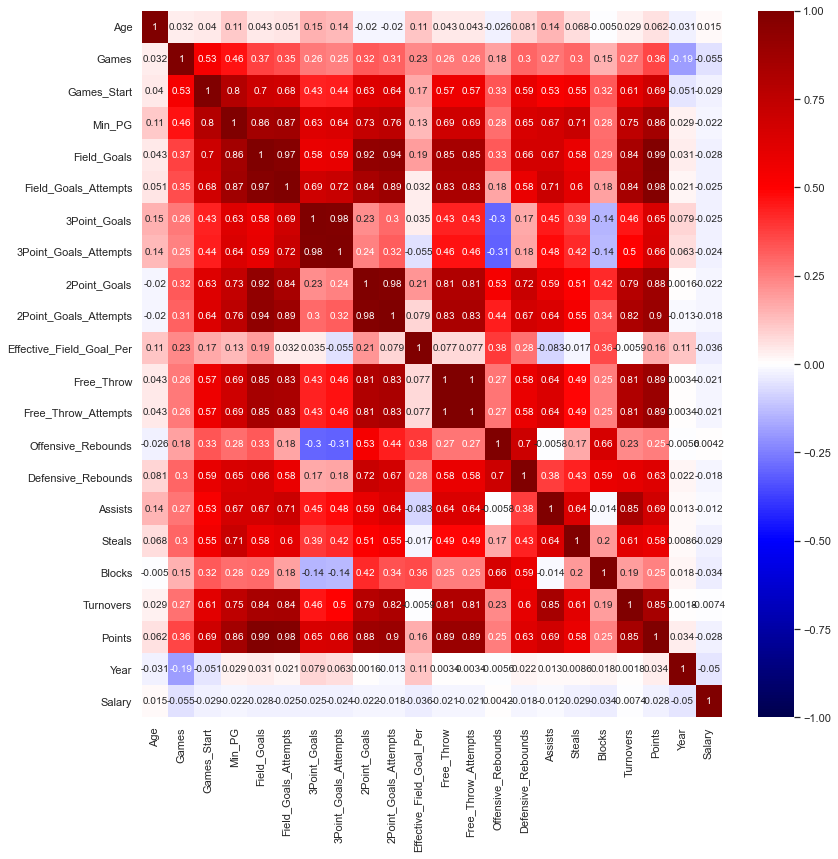

In [45]:
f, ax = plt.subplots(figsize=(13, 13))
sns.heatmap(nba_v2.corr(), cmap="seismic", annot=True, vmin=-1, vmax=1)
plt.savefig('heatmap1.png');


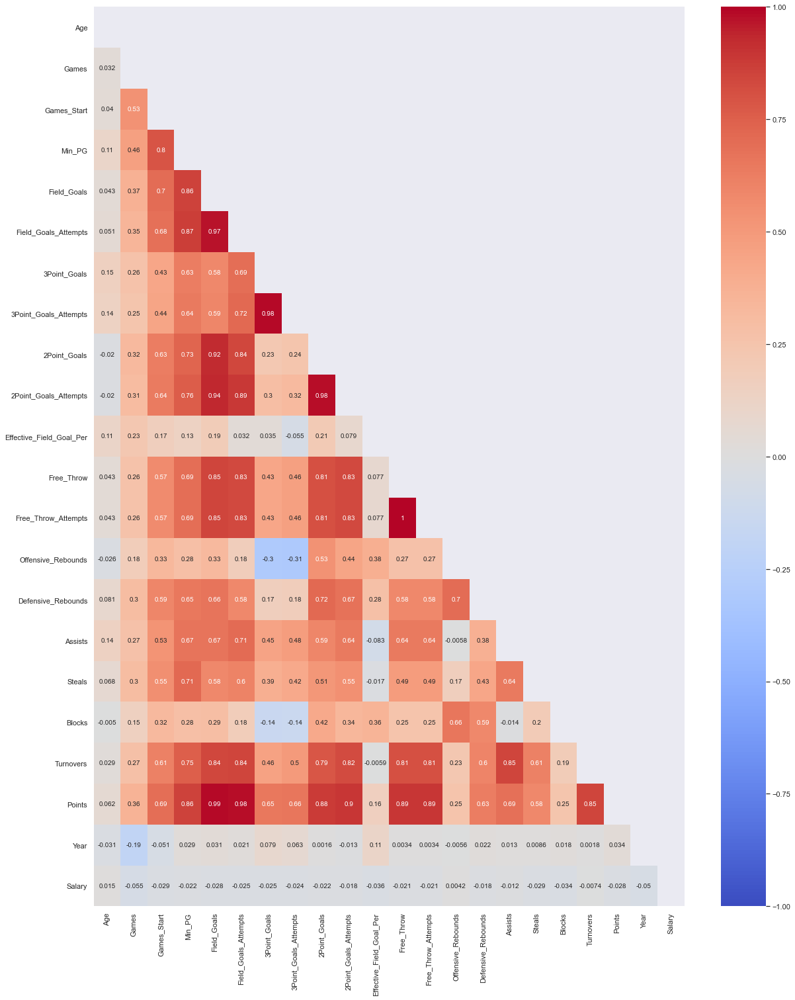

In [46]:
f, ax = plt.subplots(figsize=(20, 25))

upper = np.triu(nba_v2.corr())  # optionally, you can just look at the lower triangle
sns.heatmap(nba_v2.corr(), cmap='coolwarm', annot=True, vmin=-1, vmax=1, mask=upper);

#linewidths = .5,cbar_kws = {'shrink': .4,'ticks' : [-1, -.5, 0, 0.5, 1]}, annot_kws = {'size': 12})
plt.savefig('heatmap1.png');


The heatmap graphs shows the correlation between numerical categories. As seen in the above graph, there are many features highly correlated with each other, e.g. the number of points per game vs field goals per game. This will be considered in the modeling section. 
There are also unexpected relations between the target feature and other features. For example, it looks Salary is negative correlated to the number of games a player played which is counterintuitive. 

In [47]:
# Get the correlations with 'Salary' sorted in descending order
(nba_v2.corr()['Salary'].sort_values( key=pd.Series.abs, ascending=False))

Salary                      1.000000
Games                      -0.054795
Year                       -0.049719
Effective_Field_Goal_Per   -0.035523
Blocks                     -0.033561
Games_Start                -0.029265
Steals                     -0.028869
Points                     -0.027728
Field_Goals                -0.027700
Field_Goals_Attempts       -0.024736
3Point_Goals               -0.024603
3Point_Goals_Attempts      -0.024275
Min_PG                     -0.022103
2Point_Goals               -0.021609
Free_Throw                 -0.021478
Free_Throw_Attempts        -0.021478
Defensive_Rebounds         -0.017882
2Point_Goals_Attempts      -0.017765
Age                         0.014846
Assists                    -0.012475
Turnovers                  -0.007390
Offensive_Rebounds          0.004219
Name: Salary, dtype: float64

[Text(0.5, 0, 'Salary'),
 Text(0, 0.5, 'frequency'),
 Text(0.5, 1.0, 'Distribution of Salary')]

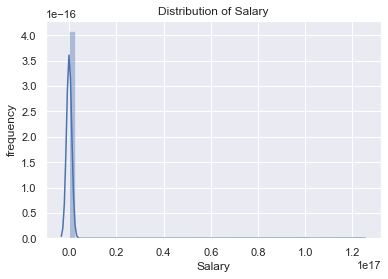

In [56]:
#First thing to check is the distribution of Salary

ax = sns.distplot(nba_v2['Salary']);
ax.set(xlabel='Salary', ylabel='frequency', title='Distribution of Salary')

The distribution of Salary is heavily right skewed. At this poing, I will remove outliers to have a data which covers majority of the players.

In [44]:
#Removing Players whose salaries are outliers

cols = ['Salary'] # one or more

Q1 = nba_v2[cols].quantile(0.25)
Q3 = nba_v2[cols].quantile(0.75)
IQR = Q3 - Q1

nba_v2_out = (nba_v2[~(nba_v2[cols] >(IQR+1.5*Q3)).any(axis=1)])            

In [45]:
(IQR+1.5*Q3)

Salary    3.169454e+07
dtype: float64

In [ ]:
f, ax = plt.subplots(figsize=(20, 25))

upper = np.triu(nba_v2_out.corr())  # optionally, you can just look at the lower triangle
sns.heatmap(nba_v2_out.corr(), cmap='coolwarm', annot=True, vmin=-1, vmax=1, mask=upper);

#linewidths = .5,cbar_kws = {'shrink': .4,'ticks' : [-1, -.5, 0, 0.5, 1]}, annot_kws = {'size': 12})
plt.savefig('heatmap1NoOutlier.png',dpi=500, bbox_inches='tight');

In [46]:
(nba_v2_out.corr()['Salary'].sort_values( key=pd.Series.abs, ascending=False))

Salary                      1.000000
Points                      0.596795
Field_Goals                 0.590772
Field_Goals_Attempts        0.577340
Min_PG                      0.561937
Free_Throw_Attempts         0.548178
Free_Throw                  0.548178
2Point_Goals_Attempts       0.545780
2Point_Goals                0.536455
Turnovers                   0.527356
Defensive_Rebounds          0.520210
Games_Start                 0.480721
Assists                     0.462115
Steals                      0.403331
3Point_Goals_Attempts       0.355251
3Point_Goals                0.349977
Age                         0.344986
Offensive_Rebounds          0.284952
Blocks                      0.272958
Games                       0.163715
Effective_Field_Goal_Per    0.091816
Year                        0.001794
Name: Salary, dtype: float64

The correlations increase in absolute value after removing outliers in the Salary feature. Also it changes the most of the correlations' sign. 
Now, the correlation between game statistics and the new target variable become positive which is more intitutive. \n

The distribution of the salary looks less skewed than the one with outliers though still skewed.

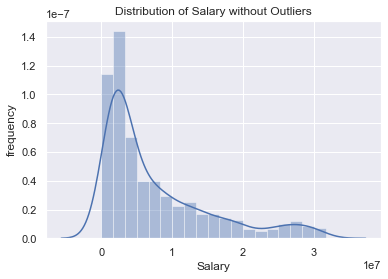

In [57]:
ax =sns.distplot((nba_v2_out['Salary']));
ax.set(xlabel='Salary', ylabel='frequency', title='Distribution of Salary without Outliers')
plt.savefig('Salary.png',dpi=500, bbox_inches='tight');

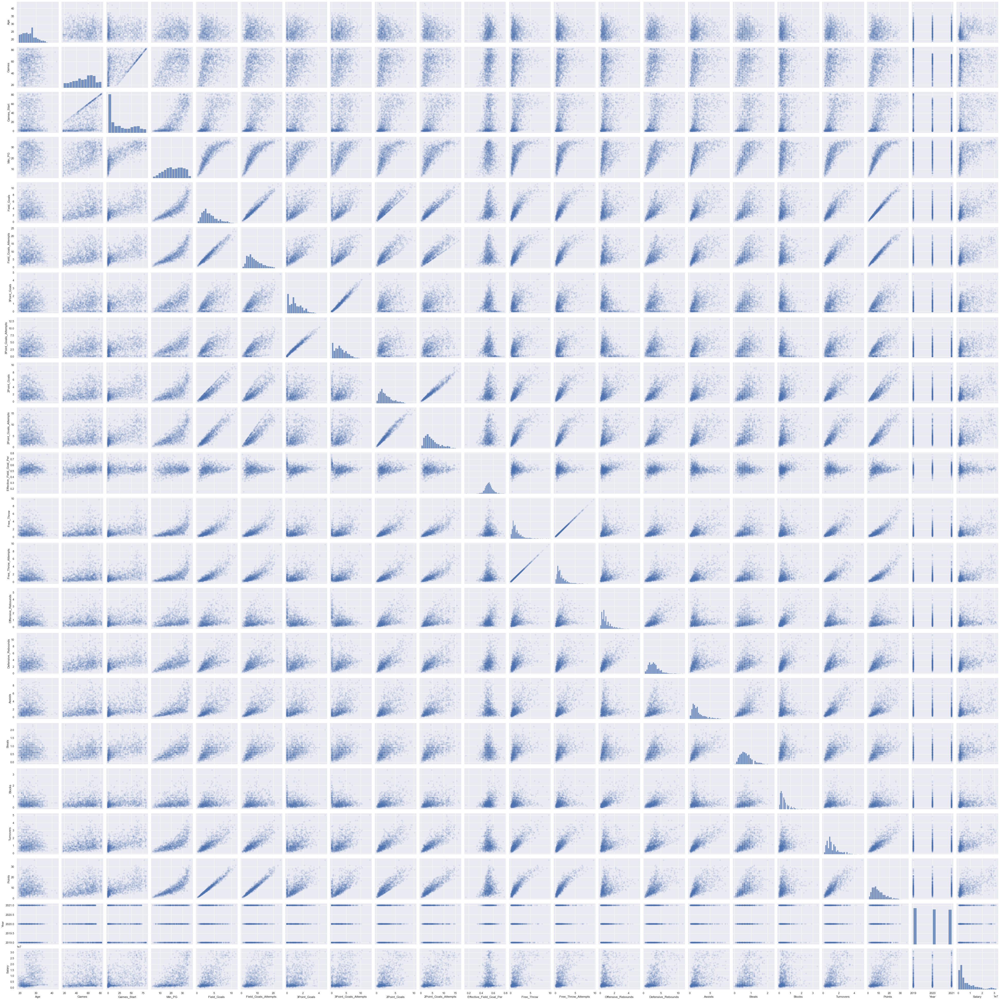

In [53]:
sns.pairplot(nba_v2_out, plot_kws=dict(alpha=.1, edgecolor='none'),dropna=True);
#or
# Sometimtes plotting PairGrid takes a while, and we don't need to see *all* the data, so a sample will do
#g = sns.PairGrid(nba_v2_out.sample(frac=0.6), diag_sharey=False, corner=True)
#g.map_lower(sns.scatterplot)
#g.map_diag(sns.distplot, kde=False)

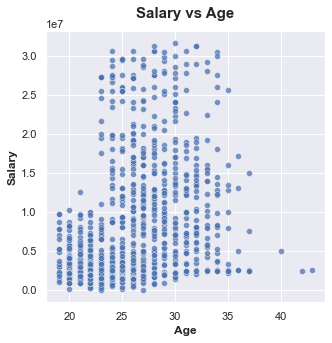

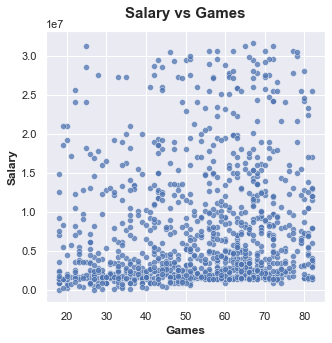

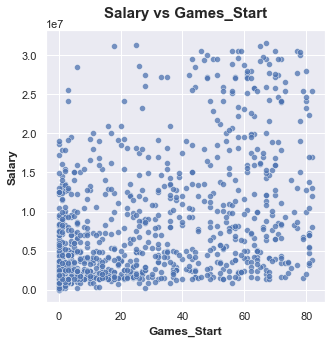

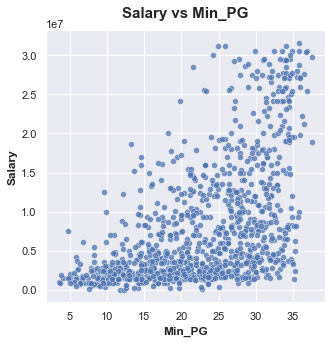

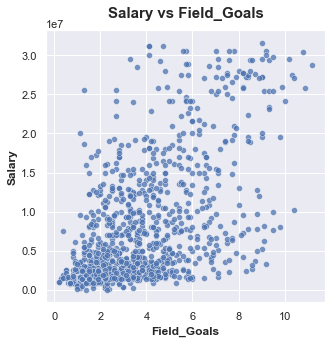

...

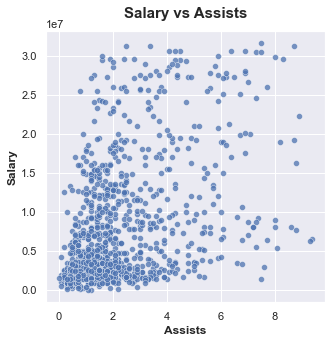

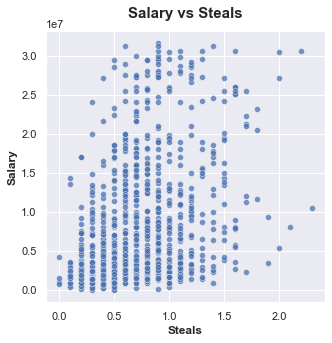

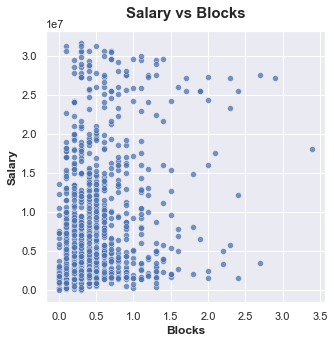

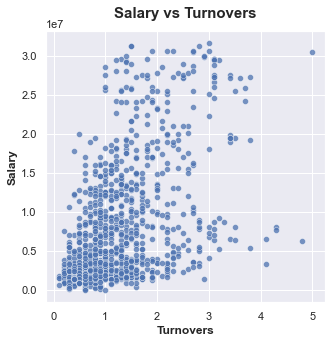

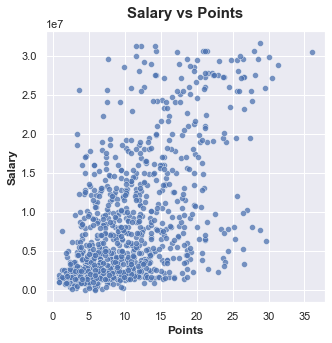

In [58]:
plot_list_columns = ['Age', 'Games', 'Games_Start', 'Min_PG', 'Field_Goals',
       'Field_Goals_Attempts', '3Point_Goals', '3Point_Goals_Attempts',
       '2Point_Goals', '2Point_Goals_Attempts', 'Effective_Field_Goal_Per',
       'Free_Throw', 'Free_Throw_Attempts', 'Offensive_Rebounds',
       'Defensive_Rebounds', 'Assists', 'Steals', 'Blocks', 'Turnovers',
       'Points']


for col in plot_list_columns:
    plt.figure(figsize= (5,5))
    ax = sns.scatterplot(nba_v2_out[col], nba_v2_out['Salary'], alpha = 0.75)
    plt.xlabel(xlabel=col, y=1.25, fontsize = 12, weight= 'bold')
    plt.ylabel(ylabel='Salary', x=1.05, fontsize = 12, weight = 'bold')
    plt.title(label = 'Salary' + ' vs ' + col, 
              fontsize = 15, y = 1.025, weight='bold');

In [47]:
nba_v2_out.shape

(1139, 25)

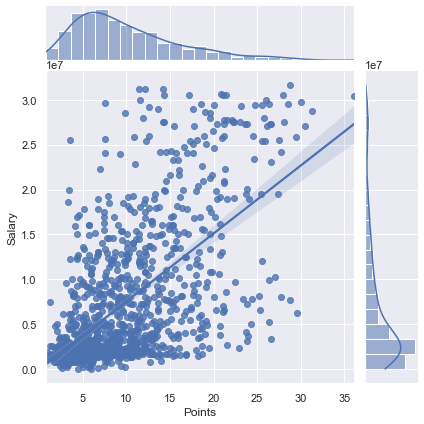

In [59]:
sns.jointplot('Points','Salary', kind="reg", data=nba_v2_out)
plt.savefig('Points vs Salary.png');

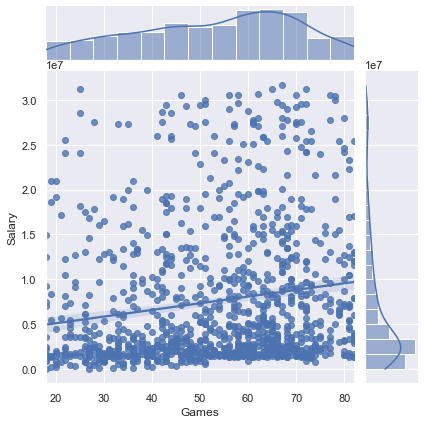

In [60]:
sns.jointplot('Games','Salary', kind="reg", data=nba_v2_out)
plt.savefig('Games vs Salary.png');

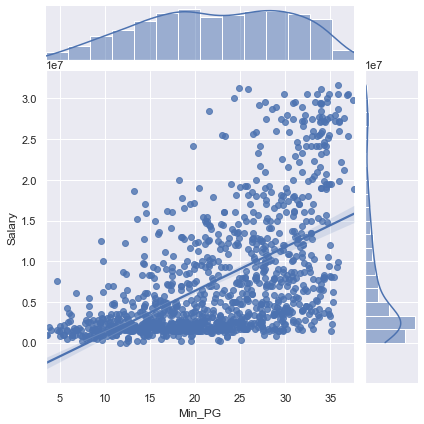

In [61]:
sns.jointplot('Min_PG','Salary', kind="reg", data=nba_v2_out);
plt.savefig('Min_PG vs Salary.png');

In [48]:
nba_v3 = nba_v2_out.dropna()
print(nba_v3.shape)

(1106, 25)


In [49]:
nba_v3.to_csv('nba_v3.csv')